#Comparing trees created with differnt distance matrices

In [3]:
# !pip install scikit-bio
# !pip install Faker


import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform

from skbio.tree import TreeNode
from skbio.tree import nj
from skbio.diversity import beta_diversity
from ete3 import Tree
from skbio.stats.distance import DistanceMatrix
from faker import Faker
#import matplotlib.pyplot as plt

# Step 1: Generate a Random Distance Matrix
def generate_distance_matrix(n):
    dist_matrix = np.random.rand(n, n)
    dist_matrix = (dist_matrix + dist_matrix.T) / 2  # Symmetrize
    np.fill_diagonal(dist_matrix, 0)  # Zero diagonal
    return dist_matrix



In [ ]:

# Generate two random distance matrices
num_species = 10  # Number of taxa
np.random.seed(512)  # For reproducibility
dist_matrix1 = generate_distance_matrix(num_species)
dist_matrix2 = generate_distance_matrix(num_species)

dist_matrix1

In [2]:
# Copied this function from skbio documentation because import didn't worked

def upgma(dm, weighted=False):
    r"""Perform unweighted pair group method with arithmetic mean (UPGMA) or its
    weighted variant (WPGMA) for phylogenetic reconstruction.

    Parameters
    ----------
    dm : skbio.DistanceMatrix
        The input distance matrix.
    weighted : bool, optional
        If True, WPGMA is performed instead of UPGMA. WPGMA is a variant of UPGMA
        which is unbiased towards the size of subtrees computed.

    Returns
    -------
    TreeNode
        A TreeNode object with estimated edge values.

    See Also
    --------
    nj

    Notes
    -----
    UPGMA is a hierarchical clustering method appearing as the `average` function
    in the SciPy package, where the linkage matrix produced by `average` is used
    to construct a TreeNode object. A weighted variant is known as WPGMA, and both
    variants are due to Sokal and Michener [1]_.

    References
    ----------
    .. [1] Sokal, R.R., & Michener, C.D. (1958). A statistical method for
       evaluating systematic relationships. University of Kansas science
       bulletin, 38, 1409-1438.

    Examples
    --------
    Define a distance matrix object for the taxa a, b, and c.

    >>> from skbio import DistanceMatrix

    >>> data = [[0, 1, 2],
    ...         [1, 0, 3],
    ...         [2, 3, 0]]
    >>> ids = list('abc')
    >>> dm = DistanceMatrix(data, ids)

    Construct a tree using UPGMA.

    >>> tree = upgma(dm)
    >>> print(tree.ascii_art())
              /-c
    ---------|
             |          /-a
              \--------|
                        \-b

    The tree also has estimated edge values assigned to each edge.

    >>> print(tree)
    (c:1.25,(a:0.5,b:0.5):0.75);
    <BLANKLINE>
    """
    # Ensure the input is a DistanceMatrix object
    if not isinstance(dm, DistanceMatrix):
        raise ValueError("Input must be a DistanceMatrix object.")

    # If weighted is set to 'False', UPGMA is performed
    if weighted is False:
        linkage_matrix = linkage(
            dm.condensed_form(), method="average", metric="euclidean"
        )
    # Otherwise, WPGMA is performed
    else:
        linkage_matrix = linkage(
            dm.condensed_form(), method="weighted", metric="euclidean"
        )

    # Construct the TreeNode from the linkage matrix
    tree = TreeNode.from_linkage_matrix(linkage_matrix, dm.ids)

    return tree

In [ ]:
!pip install Faker

In [105]:
from faker import Faker

# Create ids (Species names)

fake = Faker()
ids = []
for i in range(0, num_species):
    new_name = fake.first_name_nonbinary()
    while (new_name in ids):
        new_name = fake.first_name_nonbinary()
    ids.append(new_name)
    
print(ids)

['Sean', 'Adam', 'Bryan', 'Andrea', 'Kyle', 'Melinda', 'Lisa', 'Katherine', 'Barbara', 'Justin']


In [106]:
# Create two trees from 2 different distance matrices
dm1 = DistanceMatrix(dist_matrix1, ids)
tree1 = upgma(dm1)
#tree1 = nj(dm1)

# convert skbio tree into newick string
newick_s1 = str(tree1)
newick_s1 = newick_s1[:-1]

# #reate ete3 tree form newick string
ete_tree1 = Tree(newick_s1, format=1)
print("tree1:")
print(newick_s1)
print(ete_tree1)

print("##########################################################################################################################################")

dm2 = DistanceMatrix(dist_matrix2, ids)
tree2 = upgma(dm2)
#tree2 = nj(dm2)

# convert skbio tree into newick string
newick_s2 = str(tree2)
newick_s2 = newick_s2[:-1]

# #reate ete3 tree form newick string
ete_tree2 = Tree(newick_s2, format=1)
print("tree2:")
print(newick_s2)
print(ete_tree2)




tree1:
((Justin:0.19373020745019862,(Lisa:0.07483672937614755,Katherine:0.07483672937614755):0.11889347807405107):0.09778054651988058,((Bryan:0.17705158251885356,(Melinda:0.06933643703559642,Barbara:0.06933643703559642):0.10771514548325714):0.09800399066864951,((Adam:0.0330015055590486,Andrea:0.0330015055590486):0.15781520539055136,(Sean:0.10141674817227636,Kyle:0.10141674817227636):0.0893999627773236):0.08423886223790311):0.01645518078257613);

      /-Justin
   /-|
  |  |   /-Lisa
  |   \-|
  |      \-Katherine
  |
--|      /-Bryan
  |   /-|
  |  |  |   /-Melinda
  |  |   \-|
  |  |      \-Barbara
   \-|
     |      /-Adam
     |   /-|
     |  |   \-Andrea
      \-|
        |   /-Sean
         \-|
            \-Kyle
##########################################################################################################################################
tree2:
(((Melinda:0.15785389612400708,Lisa:0.15785389612400708):0.11167966278689362,(Katherine:0.1948554974171762,(Andrea:0.092686705

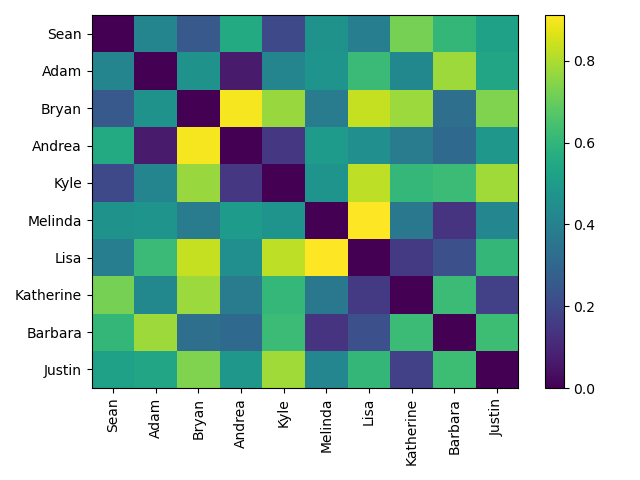

In [107]:
dm1

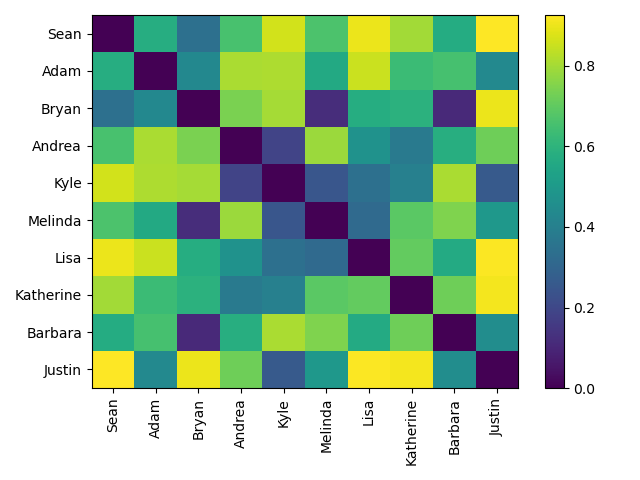

In [108]:
dm2

In [109]:


# Step 3: Compare Trees

rf, max_rf, common_leaves, parts_t1, parts_t2, unique_t1, unique_t2  = ete_tree2.robinson_foulds(ete_tree1
                                                                                                 #, unrooted_trees=True
                                                                                                 )
print(f"RF distance: {rf}")
print(f"Maximum RF distance: {max_rf}")
print(f"Common leaves: {common_leaves}")
print(f"Partitions in t1: {parts_t1}")
print(f"Partitions in t2: {parts_t2}")
print(f"Unique to t1: {unique_t1}")
print(f"Unique to t2: {unique_t2}")


RF distance: 16
Maximum RF distance: 16
Common leaves: {'Katherine', 'Andrea', 'Barbara', 'Adam', 'Lisa', 'Melinda', 'Kyle', 'Bryan', 'Justin', 'Sean'}
Partitions in t1: {('Kyle',), ('Barbara', 'Bryan', 'Sean'), ('Andrea', 'Katherine', 'Kyle'), ('Adam', 'Andrea', 'Barbara', 'Bryan', 'Justin', 'Katherine', 'Kyle', 'Lisa', 'Melinda', 'Sean'), ('Adam', 'Justin'), ('Katherine',), ('Melinda',), ('Andrea', 'Katherine', 'Kyle', 'Lisa', 'Melinda'), ('Barbara',), ('Adam',), ('Adam', 'Barbara', 'Bryan', 'Justin', 'Sean'), ('Barbara', 'Bryan'), ('Andrea',), ('Lisa',), ('Andrea', 'Kyle'), ('Lisa', 'Melinda'), ('Justin',), ('Sean',), ('Bryan',)}
Partitions in t2: {('Kyle',), ('Adam', 'Andrea'), ('Barbara', 'Melinda'), ('Adam', 'Andrea', 'Barbara', 'Bryan', 'Justin', 'Katherine', 'Kyle', 'Lisa', 'Melinda', 'Sean'), ('Katherine',), ('Justin', 'Katherine', 'Lisa'), ('Melinda',), ('Adam', 'Andrea', 'Kyle', 'Sean'), ('Barbara', 'Bryan', 'Melinda'), ('Barbara',), ('Adam',), ('Kyle', 'Sean'), ('Andrea',),

In [24]:
# put it all together in a single function

def genrate_random_ete3_tree(num_species: int, method:str="upgma", verbose:bool=False ):

    if(verbose):
        print(f"Generating a random ete3 tree with {num_species} species using {method} method...")

    # Generate two random distance matrices
    dist_matrix = generate_distance_matrix(num_species)
    

    # Create random ids (Species names)

    fake = Faker()
    ids = []
    for i in range(0, num_species):
        new_name = fake.first_name_nonbinary()
        while (new_name in ids):
            new_name = fake.first_name_nonbinary()
        ids.append(new_name)
        
    if(verbose):
        print("ids: ")
        print(ids)

    dm = DistanceMatrix(dist_matrix, ids)
    if(method == "upgma"):
        tree = upgma(dm)
    elif(method == "nj"):
        tree = nj(dm)
    else:
        raise Exception("Invalid method for tree construction") 

    # convert skbio tree into newick string
    newick_t = str(tree)
    newick_t = newick_t[:-1]

    # #reate ete3 tree form newick string
    ete_tree = Tree(newick_t, format=1)
    if(verbose):
        print("newick_string:")
        print(newick_t)
        print(ete_tree)
    
    return ete_tree
    
# Step 3: Compare Trees

np.random.seed(512)  # For reproducibility
t1 = genrate_random_ete3_tree(num_species=690, method="nj")
t2 = genrate_random_ete3_tree(num_species=690, method="nj")


In [25]:

# if(method == "upgma"):
#rf, max_rf, common_leaves, parts_t1, parts_t2, unique_t1, unique_t2  = t2.robinson_foulds(t1)
# elif(method == "nj"):
rf, max_rf, common_leaves, parts_t1, parts_t2, unique_t1, unique_t2  = t2.robinson_foulds(t1      
                                                                                                , unrooted_trees=True
                                                                                                )

print(f"RF distance: {rf}")
print(f"Maximum RF distance: {max_rf}")
print(f"Common leaves: {common_leaves}")
print(f"Partitions in t1: {parts_t1}")
print(f"Partitions in t2: {parts_t2}")
print(f"Unique to t1: {unique_t1}")
print(f"Unique to t2: {unique_t2}")
    


RF distance: 1372
Maximum RF distance: 1374
Common leaves: {'Cameron', 'Colin', 'Yvonne', 'Mikayla', 'Olivia', 'Betty', 'Lee', 'Ariana', 'Tiffany', 'Sharon', 'Martin', 'Faith', 'Yolanda', 'Frank', 'Christopher', 'Meredith', 'Darius', 'Franklin', 'Mercedes', 'Jaime', 'Preston', 'Priscilla', 'Cody', 'Corey', 'Debra', 'Kari', 'Veronica', 'Toni', 'Frances', 'Gary', 'Krystal', 'Danielle', 'Dale', 'Suzanne', 'Zoe', 'Barry', 'Gina', 'Sara', 'Tristan', 'Mark', 'Julia', 'Carly', 'Isabel', 'Jonathan', 'Vincent', 'Dwayne', 'Jodi', 'Tina', 'Sierra', 'Luke', 'Alison', 'Lynn', 'Shelby', 'Makayla', 'Garrett', 'Luis', 'Kathryn', 'Chelsey', 'Marilyn', 'Jake', 'Elizabeth', 'Sylvia', 'Destiny', 'Kristine', 'Jenna', 'Roger', 'Jermaine', 'Madison', 'Briana', 'Jillian', 'Alexa', 'Robert', 'Anna', 'Derrick', 'Curtis', 'Xavier', 'Riley', 'Beverly', 'Miranda', 'Tammie', 'Omar', 'Rita', 'Kathy', 'Maureen', 'Erika', 'Samuel', 'Ernest', 'Max', 'Tyler', 'Teresa', 'Cassie', 'Jeanne', 'Jacob', 'Warren', 'Clayton', '